# Introduction

As anyone would agree, black box Machine Learning algorithms are not very desirable. For example, if there was an algorithm that replaces the Law & Enforcement tasks we would all want to be sure that the algorithm has solid reasons and explanations on it's decisions. This way we would be sure that it works properly, when it decides on whom to go jail for their entire life.  <br />
Obviously this is just a fiction, but we may still want to know what leads our model on their predictions even if the domain is not important. <br /> 
On the following parts of this notebook, I will be applying 3 different Machine Learning (ML) models on 3 different time-series tasks. Then, I will be using 3 different Explainable Artificial Intelligence (XAI) tools to find out how they work with such time-series tasks.  <br /> <br />
The notebook will consist of 4 parts: 
- Introduction: (You were here)
- Implementation: (All the programming and results are here)
- Discussion and Comparisons: (My thoughts after implementing the XAI tools on the tasks)
- Conclusion: (Summary of the accomplishments and )

# Table of Contents for Implemetation
* ##  General Exploratory Data Analysis

* ##  Preprocessing of the Tasks
    - Sliding days as 1D Tempreture Arrays to predict next day's Temperature change direction (SDT)
    - Sliding windows with multiple columns to predict next day's Temperature (SWT)
    - Sliding windows with multiple columns to predict next day's Daily Summary (SWS)


* ##  Machine Learning Models
    - Random Forest Regression (RF)
    - Support Vector macghine (SVC)
    - XGBoost (XG)


* ##  Evaluation and understanding predictions with XAI tools
    - Lime
    - Lime for Time
    - SHAP

## General Exploratory Data Analysis

*Starting with importing the required libraries*

In [8]:
import numpy as np
import pandas as pd
import os
import shap
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
import lime
import lime.lime_tabular
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, accuracy_score
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.svm import SVC
from sklearn.impute import SimpleImputer
shap.initjs()
from lime_timeseries import LimeTimeSeriesExplanation

*Then continue by Exploring the dataset*

In [9]:
data = pd.read_csv("./weatherHistory.csv")
data.describe()
# Note: The column named "Loud Cover" is not making any sense as it is only "0" I will drop it during Preprocessing.

,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars)
count,96453.000000,96453.000000,96453.000000,96453.000000,96453.000000,96453.000000,96453.0,96453.000000
mean,11.932678,10.855029,0.734899,10.810640,187.509232,10.347325,0.0,1003.235956
std,9.551546,10.696847,0.195473,6.913571,107.383428,4.192123,0.0,116.969906
min,-21.822222,-27.716667,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
25%,4.688889,2.311111,0.600000,5.828200,116.000000,8.339800,0.0,1011.900000
50%,12.000000,12.000000,0.780000,9.965900,180.000000,10.046400,0.0,1016.450000
75%,18.838889,18.838889,0.890000,14.135800,290.000000,14.812000,0.0,1021.090000
max,39.905556,39.344444,1.000000,63.852600,359.000000,16.100000,0.0,1046.380000


In [10]:
data.info()
# Note: The data does not require any imputing or interpolation as it has no null rows at all.
# Note: Most of useful columns are numeric, no need to overthink about encoding as some task won't require any.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96453 entries, 0 to 96452
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Formatted Date            96453 non-null  object 
 1   Summary                   96453 non-null  object 
 2   Precip Type               95936 non-null  object 
 3   Temperature (C)           96453 non-null  float64
 4   Apparent Temperature (C)  96453 non-null  float64
 5   Humidity                  96453 non-null  float64
 6   Wind Speed (km/h)         96453 non-null  float64
 7   Wind Bearing (degrees)    96453 non-null  float64
 8   Visibility (km)           96453 non-null  float64
 9   Loud Cover                96453 non-null  float64
 10  Pressure (millibars)      96453 non-null  float64
 11  Daily Summary             96453 non-null  object 
dtypes: float64(8), object(4)
memory usage: 8.8+ MB


In [11]:
data.head(3)
# Note: the Dataset is designed to be "Hourly". This is good in terms of details, but I rather something less complex. So, I will change it to "Daily" on next steps.

,Formatted Date,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary
0,2006-04-01 00:00:00.000 +0200,Partly Cloudy,rain,9.472222,7.388889,0.89,14.1197,251.0,15.8263,0.0,1015.13,Partly cloudy throughout the day.
1,2006-04-01 01:00:00.000 +0200,Partly Cloudy,rain,9.355556,7.227778,0.86,14.2646,259.0,15.8263,0.0,1015.63,Partly cloudy throughout the day.
2,2006-04-01 02:00:00.000 +0200,Mostly Cloudy,rain,9.377778,9.377778,0.89,3.9284,204.0,14.9569,0.0,1015.94,Partly cloudy throughout the day.


## Preprocessing of the Tasks

we need to simplify the summaries as there are too many details we don't need. I wil do it with a custom function.

In [12]:
def simplify_summaries(base_summary):
    base_split = base_summary.split(" ")
    removals_list = ["Light","Dangerously","Partly","Mostly","and"]
    to_be_replaced_list = ["Breezy","Drizzle","Overcast"]
    replacement_list = ["Windy","Rain","Cloudy"]
    for removal in removals_list: 
        if removal in base_split:
            base_split.remove(removal)
            
    for i in range(len(to_be_replaced_list)):
        if to_be_replaced_list[i] in base_split:
            base_split.remove(to_be_replaced_list[i])
            base_split.append(replacement_list[i])
        
    base_split.sort()
    return " ".join(base_split)

In [13]:
data.Summary = data.Summary.apply(simplify_summaries)
data.head(3)
# much better now as we reduced complexity of it dramatically.

,Formatted Date,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary
0,2006-04-01 00:00:00.000 +0200,Cloudy,rain,9.472222,7.388889,0.89,14.1197,251.0,15.8263,0.0,1015.13,Partly cloudy throughout the day.
1,2006-04-01 01:00:00.000 +0200,Cloudy,rain,9.355556,7.227778,0.86,14.2646,259.0,15.8263,0.0,1015.63,Partly cloudy throughout the day.
2,2006-04-01 02:00:00.000 +0200,Cloudy,rain,9.377778,9.377778,0.89,3.9284,204.0,14.9569,0.0,1015.94,Partly cloudy throughout the day.


In [14]:
# Dropping the column named "Loud Cover" on general dataset "data" as it was always zero (not useful)
data.drop(columns=["Loud Cover"], inplace=True)

In [15]:
# Asjuting the original "Hourly" dataset to be ready for becoming new and simpler "Daily" dataset.
# Fixing the Formatted Date for pandas usage on later stages.
data['Formatted Date'] = pd.to_datetime(data['Formatted Date'], utc=True)
data.sort_values(by=['Formatted Date'], inplace=True, ascending=True)

## Sliding windows with multiple columns to predict next day's Temperature (SWT)

In [16]:
data.head(4)

,Formatted Date,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Pressure (millibars),Daily Summary
2880,2005-12-31 23:00:00+00:00,Cloudy,rain,0.577778,-4.050000,0.89,17.1143,140.0,9.9820,1016.66,Mostly cloudy throughout the day.
2881,2006-01-01 00:00:00+00:00,Cloudy,rain,1.161111,-3.238889,0.85,16.6152,139.0,9.9015,1016.15,Mostly cloudy throughout the day.
2882,2006-01-01 01:00:00+00:00,Cloudy,rain,1.666667,-3.155556,0.82,20.2538,140.0,9.9015,1015.87,Mostly cloudy throughout the day.
2883,2006-01-01 02:00:00+00:00,Cloudy,rain,1.711111,-2.194444,0.82,14.4900,140.0,9.9015,1015.56,Mostly cloudy throughout the day.


In [17]:
# Grouping by days to achieve "Daily" dataset on what's left as numerical columns for "Sliding Windows to predict Temp" task. 
swt_data = data.groupby([data['Formatted Date'].dt.date]).mean()
swt_data["Summary"] = data["Summary"].groupby([data['Formatted Date'].dt.date]).agg(lambda x:x.value_counts().index[0])

# label encoding the daily summaries to be able to fit to the ML model easily in next stages. 
le = LabelEncoder()
swt_data.Summary = le.fit_transform(swt_data.Summary)

In [18]:
# Results are sorted and daily and the summary is an integer instead of String object
swt_data.head() 

,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Pressure (millibars),Summary
Formatted Date,,,,,,,,
2005-12-31,0.577778,-4.050000,0.890000,17.114300,140.000000,9.982000,1016.660000,1
2006-01-01,4.075000,-0.174537,0.817083,21.229192,142.750000,11.348487,1011.985000,1
2006-01-02,5.263194,1.808796,0.847083,17.824713,164.583333,8.492079,1010.384167,1
2006-01-03,2.340509,0.445370,0.897083,7.726658,252.541667,9.223958,1021.170833,1
2006-01-04,2.251852,-0.663194,0.906667,12.152817,35.000000,8.352546,981.770833,1


In [19]:
# Checking the results and it is clearly worked well.
swt_data.describe()

,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Pressure (millibars),Summary
count,4019.000000,4019.000000,4019.000000,4019.000000,4019.000000,4019.000000,4019.000000,4019.000000
mean,11.927112,10.848281,0.734940,10.813734,187.488224,10.347299,1003.236631,1.055984
std,8.787951,9.939594,0.134981,5.001659,67.285953,3.212268,71.232784,0.520941
min,-15.958796,-18.825463,0.297500,1.110900,7.708333,0.000000,336.542500,0.000000
25%,5.038310,2.769213,0.632083,7.233260,141.229167,8.877808,1010.817292,1.000000
50%,12.174074,11.846296,0.744167,9.926321,183.583333,11.312263,1015.989167,1.000000
75%,19.186690,19.180440,0.842500,13.364677,237.604167,12.072317,1020.556667,1.000000
max,30.814352,30.034028,0.995000,37.929588,336.416667,15.924913,1043.532083,6.000000


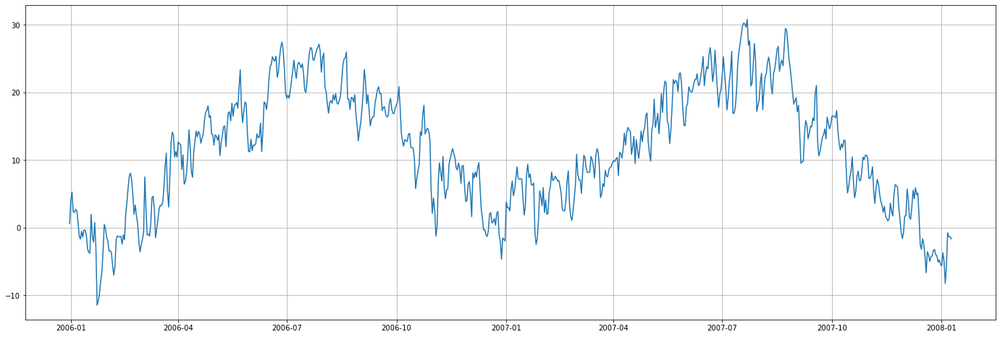

In [20]:
# Plotting approx. 2 years to have an idea about what we are working with.
plt.figure(figsize=(24,8))
plt.plot(swt_data["Temperature (C)"][:740])
plt.grid()
plt.show()

We see that there are a lot of spikes everywhere on the plot. This would increase complexity. <br>
So, I decided to apply rolling mean to reduce spikes.

In [21]:
ROLLING_MEAN_PARAMETER = 3
swt_data[["Temperature (C)","Apparent Temperature (C)","Humidity","Wind Speed (km/h)", "Wind Bearing (degrees)", "Visibility (km)", "Pressure (millibars)"]] = np.round(swt_data[["Temperature (C)","Apparent Temperature (C)","Humidity","Wind Speed (km/h)", "Wind Bearing (degrees)", "Visibility (km)", "Pressure (millibars)"]].rolling(ROLLING_MEAN_PARAMETER).mean(),3)
swt_data.dropna(inplace=True) # dropping the null days that are created by rolling mean

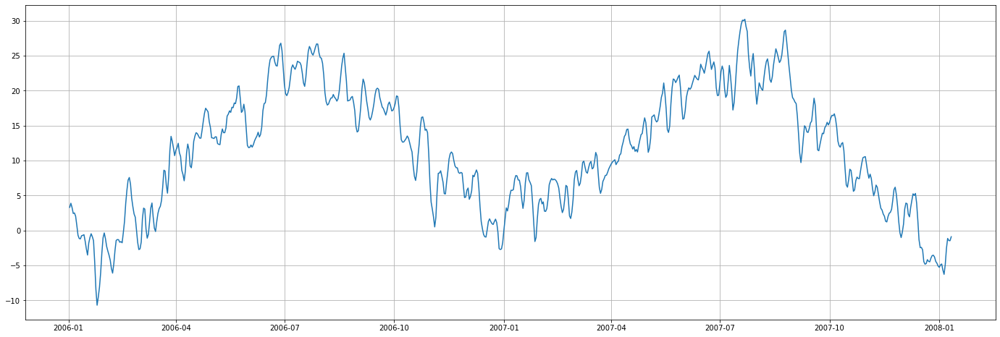

In [22]:
# Plotting approx. 2 years to have an idea about what we are working with (after rolling mean)
plt.figure(figsize=(24,8))
plt.plot(swt_data["Temperature (C)"][:740])
plt.grid()
plt.show()

As we see above, spikes are reduced dramatically. Therefore, it is much easier to learn a statistical model.

In [23]:
# Now I will design the dataset into more trainable sliding windows format.
N_DAYS_BEFORE = 5
swt_train = pd.DataFrame()

for day in range(N_DAYS_BEFORE-1,len(swt_data)):
    for i in reversed(range(1,N_DAYS_BEFORE)):
        for j in swt_data.columns:
            col_name = str(j) + " - " + str(i)
            swt_train.loc[day, col_name] = (swt_data[j][day-i])

In [24]:
# each row consist from previous 5 days with details.
swt_train.head()

,Temperature (C) - 4,Apparent Temperature (C) - 4,Humidity - 4,Wind Speed (km/h) - 4,Wind Bearing (degrees) - 4,Visibility (km) - 4,Pressure (millibars) - 4,Summary - 4,Temperature (C) - 3,Apparent Temperature (C) - 3,...,Pressure (millibars) - 2,Summary - 2,Temperature (C) - 1,Apparent Temperature (C) - 1,Humidity - 1,Wind Speed (km/h) - 1,Wind Bearing (degrees) - 1,Visibility (km) - 1,Pressure (millibars) - 1,Summary - 1
4,3.305,-0.805,0.851,18.723,149.111,9.941,1013.010,1.0,3.893,0.693,...,1004.442,1.0,2.432,0.076,0.918,9.624,142.472,7.295,979.605,1.0
5,3.893,0.693,0.854,15.594,186.625,9.688,1014.513,1.0,3.285,0.530,...,979.605,1.0,2.502,0.338,0.935,8.958,148.125,5.765,980.430,1.0
6,3.285,0.530,0.884,12.568,150.708,8.690,1004.442,1.0,2.432,0.076,...,980.430,1.0,2.044,0.309,0.944,7.103,170.472,4.510,996.581,1.0
7,2.432,0.076,0.918,9.624,142.472,7.295,979.605,1.0,2.502,0.338,...,996.581,1.0,0.732,-0.775,0.917,5.906,161.819,5.972,1029.784,0.0
8,2.502,0.338,0.935,8.958,148.125,5.765,980.430,1.0,2.044,0.309,...,1029.784,0.0,-0.683,-2.132,0.866,5.700,145.736,7.391,1033.416,1.0


In [25]:
# first part of the shapes must be the same to labels.
print(swt_train.shape)

(4013, 32)


In [26]:
# Prepearing the labels for SWT task
# ignoring the first 4 days to match training data & only getting values so we won't have issues with date index later on.
swt_labels = swt_data["Temperature (C)"][N_DAYS_BEFORE-1:].values
# first part of the shapes must be the same to train.
print(swt_labels.shape)

(4013,)


In [27]:
# Temperature (C) - 1  of 22th feature should be equal to the value of 23th label (today = tomorrow of yesterday)
print(" -- Features -- \n",swt_train.iloc[23])
print("\n -- Label -- \n", swt_labels[22])

 -- Features -- 
 Temperature (C) - 4              -10.693
Apparent Temperature (C) - 4     -14.088
Humidity - 4                       0.749
Wind Speed (km/h) - 4              8.332
Wind Bearing (degrees) - 4       122.611
Visibility (km) - 4               10.594
Pressure (millibars) - 4        1038.652
Summary - 4                        0.000
Temperature (C) - 3               -9.515
Apparent Temperature (C) - 3     -12.019
Humidity - 3                       0.758
Wind Speed (km/h) - 3              6.161
Wind Bearing (degrees) - 3       147.569
Visibility (km) - 3               10.094
Pressure (millibars) - 3        1035.109
Summary - 3                        1.000
Temperature (C) - 2               -8.113
Apparent Temperature (C) - 2     -10.827
Humidity - 2                       0.727
Wind Speed (km/h) - 2              6.720
Wind Bearing (degrees) - 2       116.931
Visibility (km) - 2                9.580
Pressure (millibars) - 2        1031.131
Summary - 2                        1.00

In [28]:
# Splitting train and test to be able to evaluate properly with some train test ratio.
swt_train_x, swt_test_x, swt_train_y, swt_test_y = train_test_split(swt_train,swt_labels, test_size=0.1)

In [29]:
# Checking the shapes for safety
print("shape of training dataset features: ",swt_train_x.shape)
print("shape of training dataset labels: ",swt_train_y.shape)
print("shape of testing dataset features: ",swt_test_x.shape)
print("shape of testing dataset labels: ",swt_test_y.shape)

shape of training dataset features:  (3611, 32)
shape of training dataset labels:  (3611,)
shape of testing dataset features:  (402, 32)
shape of testing dataset labels:  (402,)


## Sliding windows with multiple columns to predict next day's Daily Summary (SWS)

For this task, we will use the same training features from the previous tasks as the only change will occur on the labels side.

In [30]:
# Prepearing the labels for SWT task
# ignoring the first 4 days to match training data & only getting values so we won't have issues with date index later on.
sws_labels = swt_data["Summary"][N_DAYS_BEFORE-1:].values
# first part of the shapes must be the same to train.
print(sws_labels.shape)

(4013,)


In [31]:
# splitting (75/25)
sws_train_x, sws_test_x, sws_train_y, sws_test_y = train_test_split(swt_train, sws_labels, random_state=41, test_size=0.25)

In [32]:
# Checking the shapes for safety
print("shape of training dataset features: ",sws_train_x.shape)
print("shape of training dataset labels: ",sws_train_y.shape)
print("shape of testing dataset features: ",sws_test_x.shape)
print("shape of testing dataset labels: ",sws_test_y.shape)

shape of training dataset features:  (3009, 32)
shape of training dataset labels:  (3009,)
shape of testing dataset features:  (1004, 32)
shape of testing dataset labels:  (1004,)


## Sliding days as 1D Tempreture Arrays to predict next day's Temperature Change Direction (SDT)

Here i will take 30 days of temperature data and then calculate the last 5 day's average. This average value than will be used to decide on the following day's direction. So, if tomorrow is warmer than last 5 days > label is 1. Else, 0. 

In [33]:
# For this approach I will only use 1 column. this will be the "Temperature (C)"
all_temps = swt_data["Temperature (C)"].values
train_temps = []
label_temps = []
for i in range(len(all_temps)-31):
    if all_temps[i+30] >= np.mean(all_temps[i+20:i+29]):
        label_temps.append(1)
    else:
        label_temps.append(0)
        
    train_temps.append(all_temps[i:i+30])
    
train_temps = pd.DataFrame(train_temps)
label_temps = pd.Series(label_temps)

In [34]:
# Splitting the train and test 
sdt_train_x = train_temps[:-400]
sdt_test_x = train_temps[-400:]
sdt_train_y = label_temps[:-400]
sdt_test_y = label_temps[-400:]

In [35]:
# Checking the shapes for safety
print("shape of training dataset features: ",sdt_train_x.shape)
print("shape of training dataset labels: ",sdt_train_y.shape)
print("shape of testing dataset features: ",sdt_test_x.shape)
print("shape of testing dataset labels: ",sdt_test_y.shape)

shape of training dataset features:  (3586, 30)
shape of training dataset labels:  (3586,)
shape of testing dataset features:  (400, 30)
shape of testing dataset labels:  (400,)


## Machine Learning Models

* ### Random Forest Regressor

In [36]:
rf_model = RandomForestRegressor(max_depth=10) # Kept as basic as possible for easiness
rf_model.fit(swt_train_x,swt_train_y)

RandomForestRegressor(max_depth=10)

* ### XGBoost

In [37]:
my_imputer = SimpleImputer() # imputer is required for LIME when we use XGBoost
sws_train_x_imp = my_imputer.fit_transform(sws_train_x)
sws_test_x_imp = my_imputer.transform(sws_test_x)
# configurations are prepared below
my_model = xgb.XGBClassifier(n_estimators=1000, 
                            max_depth=4, 
                            eta=0.05, 
                            base_score=sws_train_y.mean())
# the actual training happens here below
hist = my_model.fit(sws_train_x_imp, sws_train_y, 
                    early_stopping_rounds=5, 
                    eval_set=[(sws_test_x_imp, sws_test_y)], eval_metric='mlogloss', 
                    verbose=10)

[0]	validation_0-mlogloss:1.80895
Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[10]	validation_0-mlogloss:1.07877
[20]	validation_0-mlogloss:0.76338
[30]	validation_0-mlogloss:0.59714
[40]	validation_0-mlogloss:0.50351
[50]	validation_0-mlogloss:0.44928
[60]	validation_0-mlogloss:0.41662
[70]	validation_0-mlogloss:0.39698
[80]	validation_0-mlogloss:0.38577
[90]	validation_0-mlogloss:0.37876
[100]	validation_0-mlogloss:0.37409
[110]	validation_0-mlogloss:0.37181
[120]	validation_0-mlogloss:0.37002
[130]	validation_0-mlogloss:0.36844
[140]	validation_0-mlogloss:0.36764
Stopping. Best iteration:
[141]	validation_0-mlogloss:0.36763



* ### Support Vector Machine

In [38]:
lr_model = SVC(probability=True, kernel='rbf') # again, models kept as basic as possible
lr_model.fit(sdt_train_x,sdt_train_y)

SVC(probability=True)

As shown above, we need to be sure that our model has parameter "probablitiy" set as True in order for XAI tools to interpret the predictions easily afterwards.

## Evaluation and understanding predictions with XAI tools

* ### RF - SWT - SHAP

Here on this part of the notebook, the first explainable AI tool and it's use case will be demonstrated.

The tool is **SHAP**. <br />
To implement this tool for our time series explanation purposes, I will use my **RandomForestRegressor** model which was trained on the Sliding Windows styled dataframe with the Temperature label. <br />
Firstly, we can start by checking if the model is worth to explain or does it require more development. <br />
For this, I will be using r^2 score. The better r^2 score means better performance. <br />


In [39]:
swt_pred_y = rf_model.predict(swt_test_x)
print("r_square score of the RandomForestRegressor model : ",r2_score(swt_test_y,swt_pred_y))

r_square score of the RandomForestRegressor model :  0.9858601574105393


As we can see above, the model performs really good on the test data. <br /> 
So we shall continue with explaining.  <br />  <br /> <br /> 
To begin our explanation on this model and the task I want to use a simple bar representation of importance. <br />
Basically, this will sort the features by decreasing importance for our trained model and plot them.

### SHAP Feature Importance

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


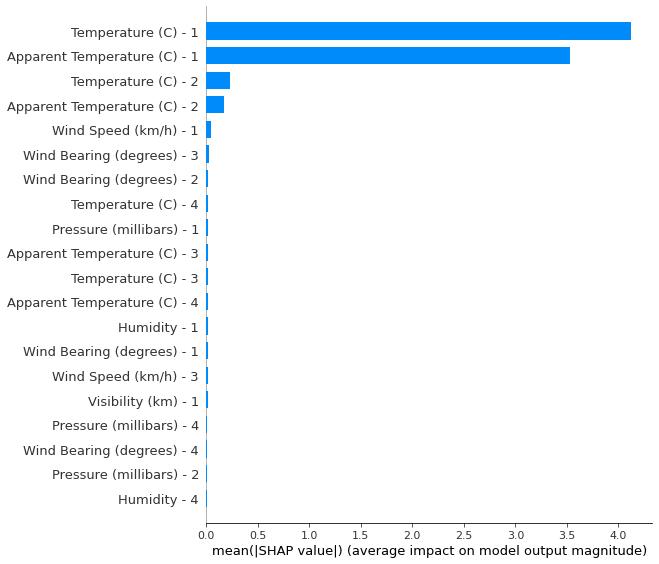

In [40]:
explainer = shap.TreeExplainer(rf_model)
shap_values = explainer.shap_values(swt_train_x)

shap.summary_plot(shap_values, swt_train_x, plot_type="bar");

The chart above explains the average impact per given column on predictions. <br />
So, if we look at it we can say the biggest effect on the prediction (today's temperature) is yesterday's Temperature. <br />
That is follwed by: Apparent Temperature of yesterday, Temperature of the day before yesterday, Apparent Temperature of the day before yesterday.
<br /> <br /> <br />
Now that we know which columns are more important when it comes to do predictions with our model, we can now see how they were actually affecting the outputs. <br />
For this, I will use a typical summary plot. Which combines feature importance with feature effects in very visible way.
### SHAP Summary Plot

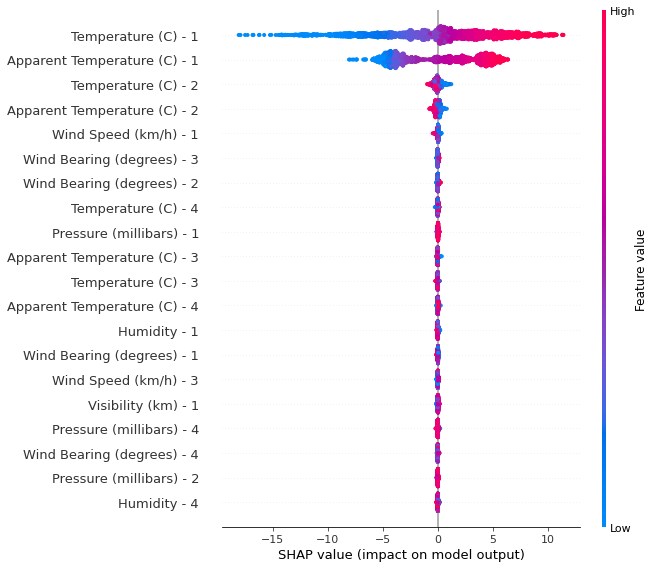

In [41]:
shap.summary_plot(shap_values, swt_train_x)

As we can see above, each point on the summary plot is a Shapley value for a feature and an instance. <br />
The position on the y-axis is determined by the feature and on the x-axis by the Shapley value. <br />
The color represents the value of the feature from low to high. <br />
Just like the previous plot, here features are ordered according to their importance. <br /> <br />
### SHAP Force Plot

In [42]:
a = shap.force_plot(explainer.expected_value, shap_values[100,:], swt_train_x.iloc[100,:])
display(a)

b = shap.force_plot(explainer.expected_value, shap_values[80,:], swt_train_x.iloc[80,:])
display(b)

c = shap.force_plot(explainer.expected_value, shap_values[70,:], swt_train_x.iloc[70,:])
display(c)

d = shap.force_plot(explainer.expected_value, shap_values[90,:], swt_train_x.iloc[90,:])
display(d)

As we can see above, I displayed force plots of predictions for the 4 different days. <br />
The most important things to pay attention here are:
* Model Output Value
* Base Value
* Forces that affect the Output value 
<br /> <br />
To begin with, the base value is the **average** output value for entire dataset. But as we can see, with the forces (affects of the values of some columns) the Model Output Value moves away from the base value. <br />
Now, we can take a look at the prediction instances above. <br /> 
At the last prediciton. We can see that the columns "Apparent Temperature(C)-1" and "Temperature(C)-1" columns increased the base value. Where the same columns for the day before applied forces to lower it. At the end prediction value become 15.83. <br /> <br /> <br /> 

Up next, is an interactive cluster of all predictions. The best part about this is that you can change the x-axis selection to have different force plots for different purposes <br /> 

### Clustered SHAP Values

In [43]:
shap.force_plot(explainer.expected_value, shap_values, swt_train_x)

shap.force_plot is slow for many thousands of rows, try subsampling your data.


To simply describe what we see above, we can say "a cummulative force plot graphs for all predictions". (This is also the reason of slowness). <br />
Go ahead and change the value on the left-hand side dropdown input if you want to experience interacitveness of the graph.

In [44]:
print("prediction : ",rf_model.predict(swt_test_x.iloc[77].values.reshape(1,32)))
print("ground truth : ",swt_test_y[77])
# very accurate prediction.

prediction :  [14.72249654]
ground truth :  15.376


* ### XG - SWS - LIME

Here on this part of the notebook, the second explainable AI tool and it's use case will be demonstrated.

The tool is **LIME**. the name stands for "Local Interpretable Model-agnostic Explanations" <br />
To implement this tool for our time series explanation purposes, I will use my **XGBoost** model which was trained on the Sliding Windows styled dataframe with the Simplified Summary Classes. <br />
Firstly, we can start by checking if the model is worth to explain or does it require more development. <br />
For this, I will be using accuracy score. The reason of using accuracy is that I implemented the model as if it was a classification problem. <br />


In [45]:
y_pred = my_model.predict(sws_test_x_imp)
accuracy_score(y_pred, sws_test_y)

0.8914342629482072

As we can see above, model performs good enough to be considered as accurate. (Almost 90%.) <br /> <br />
Next, we need to define a lambda function called " *predict_fn* ", this function will help us to get prediciton probabilities. <br />
Then, we will set up our explainer. For this, I am using LimeTabularExplainer which explains predictions on tabular (i.e. matrix) data. <br /> 

In [46]:
predict_fn = lambda x: my_model.predict_proba(x).astype(float)
explainer = lime.lime_tabular.LimeTabularExplainer(sws_test_x_imp, feature_names=sws_test_x.columns, class_names=range(0,14), verbose=True, mode='classification')

Now, we need to choose some instances to explain later on. For the purpose of making it different, I will pick 3 different predictions.

In [47]:
print(le.inverse_transform(my_model.predict(sws_test_x_imp)[60].ravel()))
print(le.inverse_transform(my_model.predict(sws_test_x_imp)[0].ravel()))
print(le.inverse_transform(my_model.predict(sws_test_x_imp)[124].ravel()))
# the indexes will be used later on.

['Clear']
['Cloudy']
['Foggy']


To make things more clear, I will store the instances above with better variable names.

In [48]:
foggy_instance = sws_test_x.iloc[124].values
cloudy_instance = sws_test_x.iloc[0].values
clear_instance = sws_test_x.iloc[60].values

Now I will initialize the explainers for each instance we declared above. <br />
The important thing here is to provide how many "possible labels" and how many "features" you want to present. <br />
For the purposes of this notebook, I limited those to smaller numbers.

In [49]:
exp1 = explainer.explain_instance(foggy_instance, predict_fn, num_features=5, labels=range(0,6))
exp2 = explainer.explain_instance(cloudy_instance, predict_fn, num_features=5, labels=range(0,6))
exp3 = explainer.explain_instance(clear_instance, predict_fn, num_features=5, labels=range(0,6))

Intercept 0.04426051997266918
Prediction_local [0.09730483]
Right: 0.013400038704276085
Intercept 0.9524369146256162
Prediction_local [0.72018345]
Right: 0.29390978813171387
Intercept 0.007515592414910422
Prediction_local [0.01304386]
Right: 0.003065752796828747
Intercept -0.004849711350614648
Prediction_local [0.14307074]
Right: 0.6724374294281006
Intercept 0.0012609697084092722
Prediction_local [0.00742741]
Right: 0.010024506598711014
Intercept 0.00195766321764543
Prediction_local [0.00651528]
Right: 0.004394602961838245
Intercept 0.06868008480122902
Prediction_local [0.02662121]
Right: 0.01822761632502079
Intercept 0.9018498649948887
Prediction_local [0.86777258]
Right: 0.9650835990905762
Intercept 0.01046440623856465
Prediction_local [0.00374948]
Right: 0.003236723132431507
Intercept 0.02092184293904064
Prediction_local [0.06672829]
Right: 0.007155979983508587
Intercept 0.003958497748706089
Prediction_local [0.00319835]
Right: 0.002071552909910679
Intercept 0.004432159446409791
Pre

Now, we can start with the presentation of the explanations with LIME. <br /> <br />

### Showing In Notebook <br />
This function is designed especially for IPython notebooks such as my notebook that one can look at :) <br />
What it shows are basically:
* Prediction Probabilities of the given instance for the related classes
* Class by Class opposite sided horizontal bar charts for each feature (Sorted By their affects on the prediciton) 
* An impractical table that shows values for related features. (Color coded by their affects)

In [50]:
exp1.show_in_notebook()

The figures above may seem complex at first sight, I reckon the best way to look is to start from top left and follow:
1. Check the class at the top of the progressbar styled graph named "Prediction probabilities". (it is 3 with 69% + yellow)
2. Find the bar chart for it("NOT 3" and "3") to look most effective features. (it is "yesterday's Visibility" which was lower than ?!?) <br />
    2.1 As you can't see, we don't see it properly :/ (Don't worry, we will see it soon :D)
1. You can check rest of the figures to gain some information about other classes. 

### As Pyplot Figure
Up next, the alternative for the ones who are happy with less details. <br />
In my opinion, the label parameter is the most important part of this function. Becuase by giving this parameter you pick what label to get graph for. 

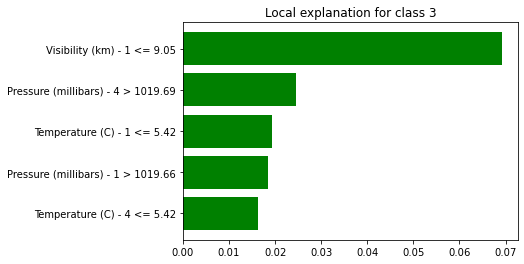

In [51]:
exp1.as_pyplot_figure(label=3)   # for class of 3, which is foggy
plt.show()

Now that we see reasons better, we can tell that prediction was foggy because on the day before the Visibility was lower than 9km. (Which is quite a good reason for such prediction) 

If we don't prefer graphs or plots, we can also receive the numerical values without any visualization. <br />
Most common methods are 
### As_list
and
### As_map

In [52]:
exp1.as_list(label=3)

[('Visibility (km) - 1 <= 9.05', 0.06919207236819369),
 ('Pressure (millibars) - 4 > 1019.69', 0.024580087338653876),
 ('Temperature (C) - 1 <= 5.42', 0.01927114500810499),
 ('Pressure (millibars) - 1 > 1019.66', 0.01849179201025636),
 ('Temperature (C) - 4 <= 5.42', 0.016385359245194655)]

In [53]:
print(exp1.as_map())

{0: [(30, 0.07233676584301543), (26, -0.04130668358198239), (29, 0.02340188461046896), (3, -0.015284735898054944), (24, 0.013897082375077092)], 1: [(29, -0.09758733884910015), (30, -0.09714757758553401), (24, -0.03690795823424398), (6, -0.028488480580957112), (26, 0.027877891476222775)], 2: [(27, -0.006403664032234338), (17, 0.004299800155043993), (22, 0.0031852035191866565), (29, 0.0024716962156437483), (24, 0.0019752291885985953)], 3: [(29, 0.06919207236819369), (6, 0.024580087338653876), (24, 0.01927114500810499), (30, 0.01849179201025636), (0, 0.016385359245194655)], 4: [(31, 0.0024118808064202343), (30, 0.001202027193994402), (29, 0.0009815902827402863), (3, 0.0009557197115743774), (24, 0.0006152174960963144)], 5: [(30, 0.0024546571586879615), (15, 0.0014491870039757592), (24, 0.0008463835881838194), (27, -0.0006335463171529221), (29, 0.0004409341197250859)]}


As one can imagine, for some implementations numerical values like above may need to be used as input. (e.g. specialized plotting methods) <br />
Therefore, it is a nice addition that LIME can provide the output without any graph. <br /> <br />
Now that we find out how LIME works, let's do a small comparison between some different predictions to see reasoning of the xgboost model.

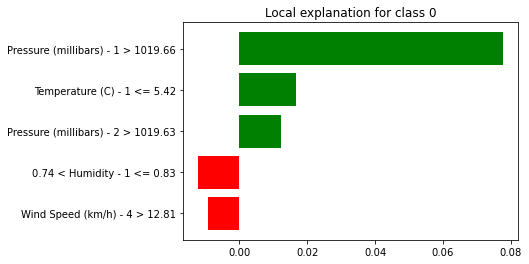

In [54]:
# label 0 is "clear"
exp3.as_pyplot_figure(label=0)
plt.show()

As shown above, High amount of pressure caused xgboost model to predict as "Clear". <br /> Which is good, because low pressure would make weather cloudy. Unlike low, high pressure would cause "Dry" conditions.   <br /> On the second most effective feature, we see the pressure of the day before yesterday. Which is also nice because we understand that predicitons for being "Clear" is mostly based on related fields. 

* ### SVC - SDT - SHAP

Here we are going to be using the Support Vector Machine on our 1 Dimensional dataset which was designed to predict the next day's temperature direction. Now, one may ask why not the value of temperatue instead. The answer to this question is 2 things, first one is the technical limitations of the Lime-for-time tool. This tool is not even an actual tool. Infact, it is just a github repository (not blaming anyone, but cannot be compared with other more popular tools like SHAP) which aims to work only on "clasification problems.". Secondly, in the very first task, I did explanations on the temperature data as "regression". So, in a sense i covered that topic with another tool. 

In [55]:
sdt_pred_y = lr_model.predict(sdt_test_x)
print("Accuracy score of the SVC model : ",accuracy_score(sdt_test_y,sdt_pred_y))   # the model performs good enough.

Accuracy score of the SVC model :  0.86


### LimeTimeSeriesExplainer

this explainer is a modified version of Tabular explainer which we used on other tasks above. It is designed to be working on such time series tasks that every data point on the array (or pandas series) could be meaningful.

Now, we will define key parameters such as "number of features" and "number of slices". These are repectively will affect: amount of feature explanation we would receive, and amount of slices the series will be split up.

In [56]:
idx = 42  # id of the data we want to explain
num_features = 30
num_slices = 30
series = sdt_test_x.iloc[idx, :]

We need to give class names as the default version would not automatically detect it. <br />
Then we can call the explainer.

In [57]:
explainer = LimeTimeSeriesExplanation(class_names=['0', '1'], feature_selection='forward_selection')
exp = explainer.explain_instance(series, lr_model.predict_proba, num_features=num_features,
                                 num_samples=sdt_train_x.shape[0], num_slices=num_slices, 
                                 replacement_method='total_mean', training_set=sdt_train_x)
print(exp.as_list())

[(29, -0.7371503213677228), (27, 0.2101181753943741), (26, 0.1684135503804039), (28, -0.13180573255434952), (24, 0.10898515608822343), (25, 0.10272257775808649), (23, 0.10208342256050547), (21, 0.09633126435437661), (22, 0.08529533799336202), (20, 0.07584959220424455), (12, 0.02589017589166161), (5, 0.02383516845862268), (11, 0.023198410771064912), (15, -0.018651990234306744), (19, 0.017183350962650997), (17, -0.01434008249183862), (1, -0.011957065005491036), (0, 0.011697532046953488), (14, -0.011061530584752607), (3, 0.009493114976972661), (8, -0.008766331700803614), (9, -0.008532970890317564), (4, -0.007452388208747002), (2, -0.006872595103892892), (7, -0.005604721751847422), (16, -0.005361531733253829), (13, 0.005181771301147672), (6, -0.004390296011419373), (18, -0.0029904239068675943), (10, 0.0017440695622196443)]


As we can see above, there are the features with corresponding affects on the predictions. <br />
To make it clear, let's take a look at those tuples presented above, '(29, -0.7203943335322466). <br />
Here we see that 29th day had 0.7 effect on the minus side. (opposite of the prediction)

Here I am only going to present features that are at least 1% effective by doing some simple python magic. Positive features will be red colored where the negative ones are colored in green. 

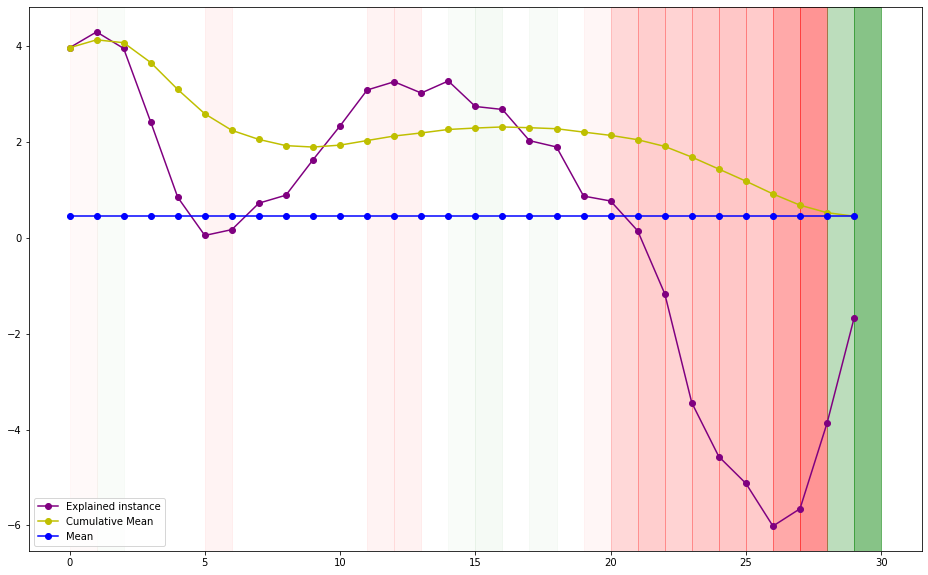

In [58]:
values_per_slice = np.ceil(len(series) / num_slices)
plt.figure(figsize=(16,10))
plt.plot(series,'-o',color="purple", label='Explained instance')
plt.plot(series.expanding().mean(), 'y-o', label='Cumulative Mean')
plt.plot([np.mean(series)]*len(series), 'b-o', label='Mean')
plt.legend(loc='lower left')
for i in range(num_features):
    feature, weight = exp.as_list()[i]
    start = feature * values_per_slice
    end = start + values_per_slice
    if abs(weight) < 0.01:
        weight = 0
    if weight > 0:
        plt.axvspan(start , end, color='red', alpha=abs(weight*2))
    else:
        plt.axvspan(start , end, color='green', alpha=abs(weight*2))
plt.show()

As we can see between the days 20 and 27 very low temperatures, and the increasing value on the last days, it was easy for our model to predict that the folowing day will be higher than the previous month's average 

In [ ]:
idx = 211
series = sdt_test_x.iloc[idx, :]
exp = explainer.explain_instance(series, lr_model.predict_proba, num_features=num_features,
                                 num_samples=sdt_train_x.shape[0], num_slices=num_slices, 
                                 replacement_method='total_mean', training_set=sdt_train_x)

In [ ]:
values_per_slice = np.ceil(len(series) / num_slices)
plt.figure(figsize=(16,10))
plt.plot(series,'-o',color="purple", label='Explained instance')
plt.plot(series.expanding().mean(), 'y-o', label='Cumulative Mean')
plt.plot([np.mean(series)]*len(series), 'b-o', label='Mean')
plt.legend(loc='lower left')
for i in range(num_features):
    feature, weight = exp.as_list()[i]
    start = feature * values_per_slice
    end = start + values_per_slice
    if weight > 0:
        plt.axvspan(start , end, color='red', alpha=abs(weight*2))
    else:
        plt.axvspan(start , end, color='green', alpha=abs(weight*2))
plt.show()

Once again we see that the last day's temperature is so high, that our model do not expect that the following day would be lower than the average of the previous days.

Up next, I will reduce the number of features to 10. So, we will only see the top 10 most effective days. 

In [ ]:
idx = 98
num_features = 10  # here I reduced to 10.
series = sdt_test_x.iloc[idx, :]
exp = explainer.explain_instance(series, lr_model.predict_proba, num_features=num_features,
                                 num_samples=sdt_train_x.shape[0], num_slices=num_slices, 
                                 replacement_method='total_mean', training_set=sdt_train_x)
print(exp.as_list())

In [ ]:
values_per_slice = np.round(len(series) / num_slices)
plt.figure(figsize=(16,10))
plt.plot(series,'-o',color="purple", label='Explained instance')
plt.plot(series.expanding().mean(), 'y-o', label='Cumulative Mean')
plt.plot([np.mean(series)]*len(series), 'b-o', label='Mean')
plt.legend(loc='lower left')
for i in range(num_features):
    feature, weight = exp.as_list()[i]
    start = feature * values_per_slice
    end = start + values_per_slice
    if weight > 0:
        plt.axvspan(start , end, color='red', alpha=abs(weight*2))
    else:
        plt.axvspan(start , end, color='green', alpha=abs(weight*2))
plt.show()

Disclaimer: the "Mean" and the "Cumulative Mean" plots on the graph are just there to be seen as supportive materials, they do not interfere neither with the model or the XAI method. 

# Discussion and Comparisons

To begin with, I will not be comparing the ML algorithms for such tasks. Each of the used models can easily be tuned for better or worse. The real discussions will be totally related to the XAI tools that I used and my opinions on them. 

I personally think that none of the mentioned XAI tools are not as developed as the ML tools that I used in this notebook. However, one of them is better than the other two for the tasks I implemented. <br /> 
Giving the whole spill without telling how I come with the winner would be unfair. So, I made a list of things that I believe are important factors in my decision. They are:

- Easiness
- Result Quality
- Configuration Capacity

<br /><br />
Let's start with the easiness. Out of the three tools, SHAP and LIME was easiest to install and work with as the LimeForTime cannot even be installed via pip. Depending on the task, one can prefer either LIME or SHAP for easiness. In a typical ML task SHAP was easier as I did not have to configure my data so much with Imputers or any other thing. However, in my research I see a lot of people suggesting LIME for more complex Deep Learning models.
<br /><br />
Next, the Quality of the results. It would be unfair to say any of these are not giving a good result. But some gives better than the others. For example, LIME gives really good outputs for each possible class with nice color coding. On the other hand SHAP gives really good force plots that are especially useful for regression tasks. LimeForTime is very specific for one domain only, which is time-series explanation and it provides fair results on that domain. So, this round is basically is a tie for our tasks.  
<br /><br />
Last but not least, the capacity for configuration. In this round, LIME can be considered as the leader because it has very wide range of possibilites and it has many possible workarounds For example, one can take the explanations as a dictionary and present their very own graphs. SHAP should be the runner-up with small gap as it provides some configuration but not as big as the LIME. finally, LimeForTime is basically not providing much to play with as it designed only for 1 specific task.

# Conclusion

First of all, this project has been great opportunity for me to learn more about XAI. However, the goal of this project was to discover usage of some XAI tools on time-series tasks. <br />
To sum up, I believe the SHAP is all around best tool for it's simplicity and quality. If one can get a good explanability without suffering so much for their models, I believe it is a win. One shall be aware that most of the ML models are developed to solve problems, not to be exlained with highest details. If SHAP tells the model predicted "duck" because the animal was walking like a duck and quacking like a duck, that would be enough and hundred times better than the typical "black box" approaches.